In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
pd.set_option('display.max_columns', None)

In [178]:
sl = pd.read_csv('slavery.csv')

In [144]:
sl.head()

,Buyer.County of Origin,Buyer.Full Name,Buyer.Origin,Buyer.State of Origin,Seller.County of Origin,Seller.Full Name,Seller.Origin,Seller.State of Origin,Slave.Age,Slave.Gender,Slave.Name,Slave.Skin Color,Transaction.Date,Transaction.Number of Adult Slaves,Transaction.Number of Child Slaves,Transaction.Number of Total Slaves Purchased,Transaction.Sale Details.Discount Rate,Transaction.Sale Details.Payment Method,Transaction.Sale Details.Predicted Interest Rate,Transaction.Sale Details.Price,Transaction.Sale Details.Prices Listed
0,Unknown,Maria Hopson,"Unknown, Unknown",Unknown,Unknown,Benjamin Screws,"Unknown, AL",AL,40.0,M,Shadrack,Unknown,10/6/1856,1,0,1,0.006027,Cash,0.07477,650.0,1
1,New Orleans,Peyton N. Reynolds,"New Orleans, LA",LA,New Orleans,Santiago Galseran,"New Orleans, LA",LA,44.0,F,Jane,Negro,10/7/1856,1,0,1,0.006027,Cash,0.07477,550.0,1
2,New Orleans,Heloise Bagneris,"New Orleans, LA",LA,New Orleans,Pierre Macou,"New Orleans, LA",LA,24.0,F,Helen,Negro,10/1/1856,1,0,1,0.006027,Cash,0.07477,1000.0,1
3,Jefferson,Francis Dugue Jr.,"Jefferson, LA",LA,Vanzand,Benjamin Franklin Irby,"Vanzand, TX",TX,23.0,M,Jeff,Negro,10/8/1856,1,0,1,0.006027,Cash,0.07477,1400.0,1
4,New Orleans,Anthony O'Dowd,"New Orleans, LA",LA,New Orleans,Richard Condon,"New Orleans, LA",LA,12.0,M,John,Negro,10/8/1856,1,0,1,0.006027,Cash,0.07477,700.0,1


In [179]:
sl.shape

(9599, 21)

In [146]:
sl.columns

Index(['Buyer.County of Origin', 'Buyer.Full Name', 'Buyer.Origin',
       'Buyer.State of Origin', 'Seller.County of Origin', 'Seller.Full Name',
       'Seller.Origin', 'Seller.State of Origin', 'Slave.Age', 'Slave.Gender',
       'Slave.Name', 'Slave.Skin Color', 'Transaction.Date',
       'Transaction.Number of Adult Slaves',
       'Transaction.Number of Child Slaves',
       'Transaction.Number of Total Slaves Purchased',
       'Transaction.Sale Details.Discount Rate',
       'Transaction.Sale Details.Payment Method',
       'Transaction.Sale Details.Predicted Interest Rate',
       'Transaction.Sale Details.Price',
       'Transaction.Sale Details.Prices Listed'],
      dtype='object')

In [180]:
sl.rename(columns = {'Buyer.County of Origin':'Buyer County','Buyer.Full Name':'Buyer Name', 'Buyer.Origin':'Buyer Origin',
       'Buyer.State of Origin':'Buyer State', 'Seller.County of Origin':'Seller County', 'Seller.Full Name':'Seller Name',
       'Seller.Origin':'Seller Origin', 'Seller.State of Origin':'Seller State', 'Slave.Age':'Slave Age', 'Slave.Gender':'Slave Gender',
       'Slave.Name':'Slave Name', 'Slave.Skin Color':'Slave Skin Color', 'Transaction.Date':'Transaction Date',
       'Transaction.Number of Adult Slaves':'Number of Adult Slaves',
       'Transaction.Number of Child Slaves':'Number of Child Slaves',
       'Transaction.Number of Total Slaves Purchased':'Total Slaves',
       'Transaction.Sale Details.Discount Rate':'Sales Discount Rate',
       'Transaction.Sale Details.Payment Method':'Payment Method',
       'Transaction.Sale Details.Predicted Interest Rate':'Predicted Interest Rate',
       'Transaction.Sale Details.Price':'Price',
       'Transaction.Sale Details.Prices Listed':'Prices Listed'},inplace = True)

In [185]:
sl.dropna(inplace = True)

In [129]:
sl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1970 entries, 0 to 9592
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Buyer County             1970 non-null   object        
 1   Buyer Name               1970 non-null   object        
 2   Buyer Origin             1970 non-null   object        
 3   Buyer State              1970 non-null   object        
 4   Seller County            1970 non-null   object        
 5   Seller Name              1970 non-null   object        
 6   Seller Origin            1970 non-null   object        
 7   Seller State             1970 non-null   object        
 8   Slave Age                1970 non-null   float64       
 9   Slave Gender             1970 non-null   object        
 10  Slave Name               1970 non-null   object        
 11  Slave Skin Color         1970 non-null   object        
 12  Transaction Date         1970 non-

In [181]:
sl['Transaction Date'] = pd.to_datetime(sl['Transaction Date'], errors='coerce')

In [182]:
sl['Transaction Date']= pd.to_datetime(sl['Transaction Date'])

In [132]:
sl.describe().round(1)

,Slave Age,Number of Adult Slaves,Number of Child Slaves,Total Slaves,Sales Discount Rate,Predicted Interest Rate,Price,Prices Listed,Year,Month
count,1970.0,1970.0,1970.0,1970.0,1970.0,1970.0,1970.0,1970.0,1970.0,1970.0
mean,25.4,2.2,0.2,2.5,0.0,0.1,1680.0,1.6,1858.5,5.0
std,10.9,6.0,0.7,6.0,0.0,0.0,4244.1,2.4,1.4,3.4
min,-1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1837.0,1.0
25%,18.0,1.0,0.0,1.0,0.0,0.1,900.0,1.0,1857.0,2.0
50%,23.0,1.0,0.0,1.0,0.0,0.1,1225.0,1.0,1859.0,4.0
75%,30.0,2.0,0.0,2.0,0.0,0.1,1500.0,1.0,1860.0,7.0
max,80.0,147.0,11.0,148.0,0.0,0.1,96500.0,41.0,1861.0,12.0


In [183]:
sl['Year'] = pd.DatetimeIndex(sl['Transaction Date']).year
sl['Month'] = pd.DatetimeIndex(sl['Transaction Date']).month

In [212]:
sl['Year'] = sl['Year'].astype(int)
sl['Month'] = sl['Month'].astype(int)
sl['Slave Age'] = sl['Slave Age'].astype(int)

In [191]:
sl['Slave Gender'].replace({'.':'Male'},inplace = True)

In [197]:
sl['Buyer State'].replace({'France':'TX'},inplace = True)

In [205]:
sl['Buyer State'].replace({'.':'Unknown'},inplace = True)

In [78]:
sl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9591 entries, 0 to 9598
Data columns (total 23 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Buyer County             9591 non-null   object        
 1   Buyer Name               9591 non-null   object        
 2   Buyer Origin             9591 non-null   object        
 3   Buyer State              9591 non-null   object        
 4   Seller County            9591 non-null   object        
 5   Seller Name              9591 non-null   object        
 6   Seller Origin            9591 non-null   object        
 7   Seller State             9591 non-null   object        
 8   Slave Age                9591 non-null   float64       
 9   Slave Gender             9591 non-null   object        
 10  Slave Name               9591 non-null   object        
 11  Slave Skin Color         9591 non-null   object        
 12  Transaction Date         9591 non-

In [155]:
sl.corr()

,Slave Age,Number of Adult Slaves,Number of Child Slaves,Total Slaves,Sales Discount Rate,Predicted Interest Rate,Price,Prices Listed,Year,Month
Slave Age,1.000000,0.045496,0.110994,0.068330,-0.048347,-0.048583,0.018110,-0.020715,-0.003152,0.016746
Number of Adult Slaves,0.045496,1.000000,0.017178,0.976175,-0.002458,-0.001685,0.747815,0.438292,-0.005917,-0.026515
Number of Child Slaves,0.110994,0.017178,1.000000,0.233723,-0.063945,-0.064040,0.069890,0.037878,-0.005695,-0.013498
Total Slaves,0.068330,0.976175,0.233723,1.000000,-0.016267,-0.015536,0.742377,0.434436,-0.006990,-0.028713
Sales Discount Rate,-0.048347,-0.002458,-0.063945,-0.016267,1.000000,0.999974,-0.088399,0.028612,-0.008258,0.002441
Predicted Interest Rate,-0.048583,-0.001685,-0.064040,-0.015536,0.999974,1.000000,-0.087722,0.029455,-0.008435,0.002236
Price,0.018110,0.747815,0.069890,0.742377,-0.088399,-0.087722,1.000000,0.006319,0.032253,-0.030119
Prices Listed,-0.020715,0.438292,0.037878,0.434436,0.028612,0.029455,0.006319,1.000000,-0.000773,-0.018480
Year,-0.003152,-0.005917,-0.005695,-0.006990,-0.008258,-0.008435,0.032253,-0.000773,1.000000,-0.197753
Month,0.016746,-0.026515,-0.013498,-0.028713,0.002441,0.002236,-0.030119,-0.018480,-0.197753,1.000000


<AxesSubplot:>

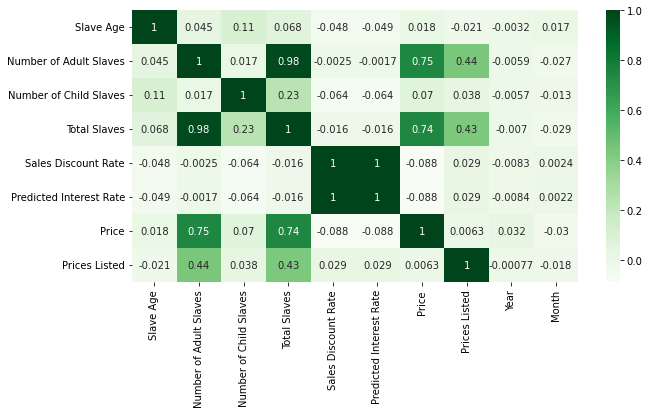

In [156]:
plt.figure(figsize = (10,5))
sns.heatmap(sl.corr().drop(['Year', 'Month']), annot = True,cmap = 'Greens')

In [60]:
int_float = []
for x in sl.dtypes.index:
    if sl.dtypes[x] == 'float':
        int_col.append(x)
        
int_float

['Slave Age',
 'Sales Discount Rate',
 'Predicted Interest Rate',
 'Price',
 'Year',
 'Month']

In [13]:
int_col = []
for x in sl.dtypes.index:
    if sl.dtypes[x] == 'int64':
        int_col.append(x)
        
int_col

['Number of Adult Slaves',
 'Number of Child Slaves',
 'Total Slaves',
 'Prices Listed']

In [157]:
sl.head(3)

,Buyer County,Buyer Name,Buyer Origin,Buyer State,Seller County,Seller Name,Seller Origin,Seller State,Slave Age,Slave Gender,Slave Name,Slave Skin Color,Transaction Date,Number of Adult Slaves,Number of Child Slaves,Total Slaves,Sales Discount Rate,Payment Method,Predicted Interest Rate,Price,Prices Listed,Year,Month
0,Unknown,Maria Hopson,"Unknown, Unknown",Unknown,Unknown,Benjamin Screws,"Unknown, AL",AL,40.0,M,Shadrack,Unknown,1856-10-06,1,0,1,0.006027,Cash,0.07477,650.0,1,1856,10
1,New Orleans,Peyton N. Reynolds,"New Orleans, LA",LA,New Orleans,Santiago Galseran,"New Orleans, LA",LA,44.0,F,Jane,Negro,1856-10-07,1,0,1,0.006027,Cash,0.07477,550.0,1,1856,10
2,New Orleans,Heloise Bagneris,"New Orleans, LA",LA,New Orleans,Pierre Macou,"New Orleans, LA",LA,24.0,F,Helen,Negro,1856-10-01,1,0,1,0.006027,Cash,0.07477,1000.0,1,1856,10


In [158]:
sl.pivot_table(index = 'Year', values = ['Number of Adult Slaves','Number of Child Slaves','Total Slaves'],aggfunc='sum').sort_values(by = 'Total Slaves', ascending = False)[:10]

,Number of Adult Slaves,Number of Child Slaves,Total Slaves
Year,,,
1859,3940,552,4492
1857,3209,488,3697
1858,2859,503,3362
1860,2815,401,3216
1861,995,191,1186
1856,770,128,898
1854,14,0,14
1855,10,3,13
1853,4,0,4


In [314]:
fig = px.pie(sl, values='Number of Adult Slaves', names='Year',
             title='Number of Adult Slaves by Year',
             hover_data=['Predicted Interest Rate'], labels='Number of Adult Slaves')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [139]:
sl.pivot_table(index = 'Slave Skin Color', values = ['Number of Adult Slaves','Number of Child Slaves','Total Slaves'],aggfunc='sum').sort_values(by = 'Total Slaves', ascending = False)[:10]

,Number of Adult Slaves,Number of Child Slaves,Total Slaves
Slave Skin Color,,,
Negro,2464,268,2732
Unknown,1092,52,1144
Mulatto,302,39,341
Griff,293,40,333
Black,160,16,176
Dark Griff,32,9,41
Yellow,25,0,25
Dark,21,0,21
Copper,6,2,8


In [315]:
fig = px.pie(sl, values='Total Slaves', names='Slave Skin Color',
             title='Total Slaves by Slave Skin Color',
             hover_data=['Total Slaves'], labels='Total Slaves')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [138]:
sl.pivot_table(index = 'Seller Name', values = ['Number of Adult Slaves','Number of Child Slaves','Total Slaves'],aggfunc='sum').sort_values(by = 'Total Slaves', ascending = False)[:10]

,Number of Adult Slaves,Number of Child Slaves,Total Slaves
Seller Name,,,
Bernard Moore Campbell,471,14,485
Jeremiah Smith,396,6,402
William E. Starke,154,0,154
James S. Deus,147,1,148
Jonathan Means Wilson,113,2,115
Walter Nicol,115,0,115
Robert Henry Elam,94,1,95
Joseph Bruin,87,4,91
Nelson Clement Trowbridge,84,6,90


In [141]:
sl.pivot_table(index = ['Buyer County','Buyer Name'], values = ['Number of Adult Slaves','Number of Child Slaves','Total Slaves'],aggfunc='sum').sort_values(by = 'Total Slaves', ascending = False)[:10]

Number of Adult Slaves  \
Buyer County Buyer Name                                       
Ascension    John L. Manning                            154   
Unknown      Henry Doyal                                147   
             George F. C. Bachelder                     115   
Rapides      William Bailey                              60   
Tensas       John I. Tyson                               52   
Bossier      Abel Skannal                                45   
Rapides      Ralph Smith                                 41   
Concordia    Elias J. Hoover                             37   
Terrebonne   Robert R. Barrow                            37   
Carroll      Daniel McNeill                              34   

                                     Number of Child Slaves  Total Slaves  
Buyer County Buyer Name                                                    
Ascension    John L. Manning                              0           154  
Unknown      Henry Doyal                                  1           148  
             George F. C. Bachelder                       0           115  
Rapides      William Bailey                               0            60  
Tensas       John I. Tyson                                0            52  
Bossier      Abel Skannal                                 4            49  
Rapides      Ralph Smith                                  3            44  
Concordia    Elias J. Hoover                              1            38  
Terrebonne   Robert R. Barrow                             0            37  
Carroll      Daniel McNeill                               1            35

In [142]:
sl['Year'].value_counts()[:10]

1859    524
1857    438
1860    398
1858    394
1861    127
1856     83
1837      1
1850      1
1853      1
1851      1
Name: Year, dtype: int64

<AxesSubplot:xlabel='Year', ylabel='count'>

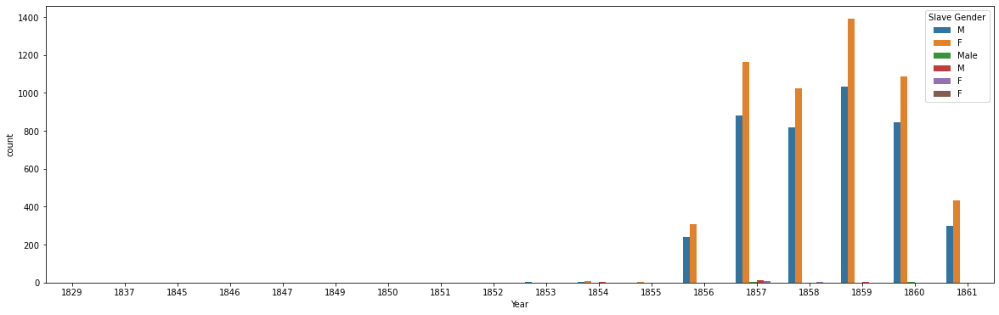

In [320]:
plt.figure(figsize = (20,6))
sns.countplot(x='Year', data=sl, hue='Slave Gender')

In [114]:
fig = px.pie(sl, values='Total Slaves', names='Year', title='Total Slaves by Gender')
fig.show()

In [247]:
sl['Buyer County'].value_counts()[:10]

New Orleans      6857
Unknown           535
Jefferson         209
Iberville         120
St. James         120
Natchitoches       86
Assumption         85
Plaquemines        85
Pointe Coupee      76
St. Mary           76
Name: Buyer County, dtype: int64

In [215]:
sl['Slave Age'].value_counts()[:10]

18    437
20    428
30    420
19    406
22    403
24    355
23    355
17    350
35    338
28    332
Name: Slave Age, dtype: int64

<AxesSubplot:xlabel='Slave Age', ylabel='count'>

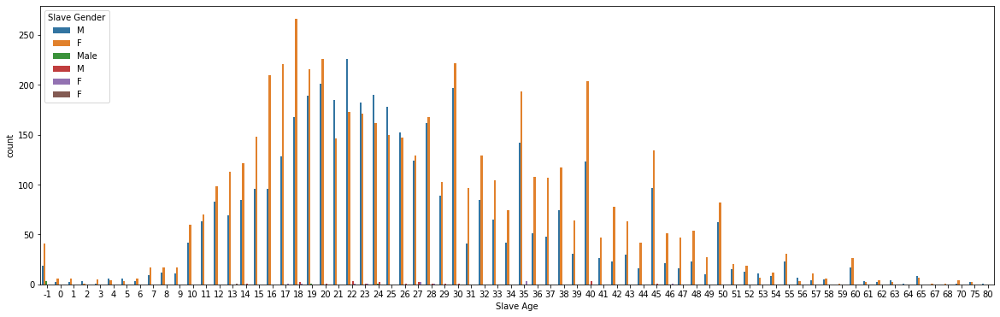

In [322]:
plt.figure(figsize = (20,6))
sns.countplot(x='Slave Age', data=sl, hue='Slave Gender')

In [107]:
import plotly.express as px
df = px.data.tips()
fig = px.histogram(sl, x="Slave Age", color = 'Slave Gender')
fig.show()

In [192]:
sl['Slave Gender'].value_counts()

F           5424
M           4130
M             20
F             11
Male           5
F              1
Name: Slave Gender, dtype: int64

In [193]:
fig = px.pie(sl, values='Total Slaves', names='Slave Gender', title='Total Slaves by Gender')
fig.show()

In [263]:
sl.tail(3)

,Buyer County,Buyer Name,Buyer Origin,Buyer State,Seller County,Seller Name,Seller Origin,Seller State,Slave Age,Slave Gender,Slave Name,Slave Skin Color,Transaction Date,Number of Adult Slaves,Number of Child Slaves,Total Slaves,Sales Discount Rate,Payment Method,Predicted Interest Rate,Price,Prices Listed,Year,Month
9596,New Orleans,Matthew Jules Bujac,"New Orleans, LA",LA,Jefferson,Nywatt C. Cutler,"Jefferson, LA",LA,25,F,Thomassine,Mulatto,1861-08-03,1,1,2,0.006027,Cash,0.074770,1100.0,1,1861,8
9597,New Orleans,Sarah Ann Chadwick,"New Orleans, LA",LA,New Orleans,John G. Chadwick,"New Orleans, LA",LA,24,F,Lucinda,Negro,1861-05-07,3,0,3,0.006055,Cash and Credit,0.075125,1600.0,1,1861,5
9598,New Orleans,Pierre Balois,"New Orleans, LA",LA,Lafayette,Antoine Guidry,"Lafayette, LA",LA,42,M,Emilien,Unknown,1861-07-29,1,0,1,0.005850,Cash and Credit,0.072497,1600.0,1,1861,7


In [269]:
 select = sl[['Seller County', 'Slave Age', 'Slave Skin Color', 'Price']]

In [270]:
select.head(3)

,Seller County,Slave Age,Slave Skin Color,Price
0,Unknown,40,Unknown,650.0
1,New Orleans,44,Negro,550.0
2,New Orleans,24,Negro,1000.0


In [277]:
select[(sl['Seller County']=='New Orleans') &
       (select['Slave Age'] < 40) &
       (select['Slave Skin Color'] == 'Negro') & 
       (select['Price'] >0)].sort_values(by = 'Price', ascending = False)[:15]

,Seller County,Slave Age,Slave Skin Color,Price
2670,New Orleans,30,Negro,27100.00
3123,New Orleans,30,Negro,24900.00
1173,New Orleans,35,Negro,23000.00
2936,New Orleans,22,Negro,19500.00
6041,New Orleans,32,Negro,15500.00
9258,New Orleans,32,Negro,15500.00
9216,New Orleans,26,Negro,12950.00
117,New Orleans,30,Negro,11000.00
3112,New Orleans,25,Negro,10500.00
9169,New Orleans,31,Negro,9953.11


In [266]:
sl.groupby('Slave Skin Color').sum()['Sales Discount Rate'].round(2).sort_values( ascending = False)[:10]

Slave Skin Color
Negro           36.62
Mulatto          8.08
Griff            6.34
Unknown          3.59
Black            0.93
Dark Griff       0.57
Yellow           0.30
Creole Negro     0.18
Quarteroon       0.14
Light Griff      0.09
Name: Sales Discount Rate, dtype: float64

In [265]:
sl.groupby('Slave Skin Color').sum()['Predicted Interest Rate'].round(2).sort_values( ascending = False)[:10]

Slave Skin Color
Negro           454.29
Mulatto         100.21
Griff            78.67
Unknown          44.54
Black            11.52
Dark Griff        7.01
Yellow            3.73
Creole Negro      2.21
Quarteroon        1.72
Light Griff       1.12
Name: Predicted Interest Rate, dtype: float64

In [302]:
fig = px.pie(sl, values='Predicted Interest Rate', names='Slave Skin Color',
             title='Predicted Interest Rate by Slave Skin Color',
             hover_data=['Predicted Interest Rate'], labels='Predicted Interest Rate')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [207]:
sl['Buyer State'].value_counts()[:10]

LA         8699
Unknown     499
MS          156
TX           58
AL           41
AR           32
MD           23
VA           15
TN           13
MO           10
Name: Buyer State, dtype: int64

In [210]:
sl['Seller State'].value_counts()[:10]

LA         7362
Unknown     489
MD          246
VA          227
AL          194
MS          174
MO          145
TX          142
GA          119
TN          101
Name: Seller State, dtype: int64

In [204]:
sl['Buyer State'] = sl['Buyer State'].str.strip()

In [208]:
sl['Seller County'].value_counts()[:10]

New Orleans    6416
Unknown         603
Baltimore       231
Richmond        199
Jefferson       171
Mobile           68
Montgomery       67
Orleans          59
St. Louis        59
St. Bernard      54
Name: Seller County, dtype: int64

In [262]:
sl.groupby(['Slave Skin Color']).sum()['Price'].round(2).sort_values( ascending = False)[:10]

Slave Skin Color
Negro           7771129.47
Mulatto         1584141.46
Unknown         1388227.96
Griff           1226601.25
Black            226921.50
Dark Griff       111689.30
Yellow            64922.50
Creole Negro      33068.00
Quarteroon        20050.00
Brown             18538.00
Name: Price, dtype: float64

In [308]:
fig = px.bar(sl, x='Slave Skin Color', y='Price',
             hover_data=['Price'], color = 'Price',
            height=400)
fig.show()

In [301]:
fig = px.pie(sl, values='Price', names='Slave Skin Color',
             title='Total Slaves by Slave Skin Color',
             hover_data=['Price'], labels='Price')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [232]:
suma = sl['Number of Adult Slaves'].sum()
print("The sum of adults sold as slaves in the period under review is {}".format(suma))

The sum of adults sold as slaves in the period under review is 14627


In [234]:
sumc = sl['Number of Child Slaves'].sum()
print("The sum of children sold as slaves in the period under review is {}".format(sumc))

The sum of children sold as slaves in the period under review is 2268


In [236]:
sumall = sl['Total Slaves'].sum()
print("The sum of all Slaves sold in the period under review is {}".format(sumall))

The sum of all Slaves sold in the period under review is 16895


In [244]:
sl['Payment Method'].value_counts()[:10]

Cash               7135
Cash and Credit    1311
Credit              848
Donation             91
Exchange, Cash       75
Exchange             74
Cash                 19
Barter               15
Barter, Cash          9
Emancipation          6
Name: Payment Method, dtype: int64

<AxesSubplot:xlabel='Payment Method', ylabel='count'>

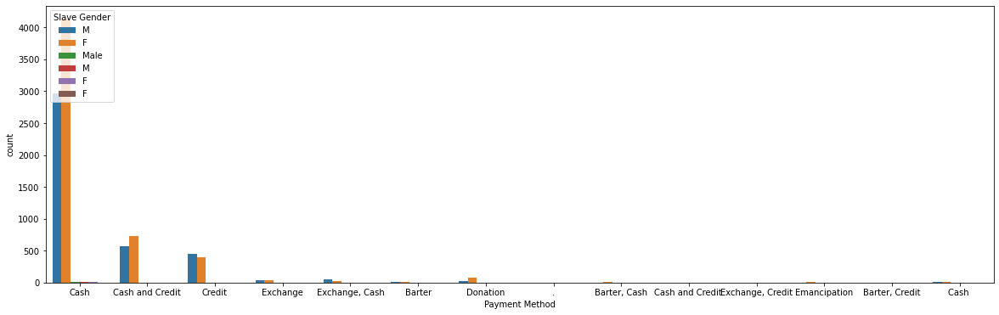

In [324]:
plt.figure(figsize = (20,6))
sns.countplot(x='Payment Method', data=sl, hue='Slave Gender')

In [290]:
sl.groupby(['Month']).count()['Total Slaves'].sort_values( ascending = False)[:10]

Month
March       1295
April       1165
February    1063
May          978
January      965
December     857
June         745
November     635
July         564
October      550
Name: Total Slaves, dtype: int64

In [295]:
fig = px.pie(sl, values='Total Slaves', names='Month',
             title='Total Slaves by Month',
             hover_data=['Total Slaves'], labels='Total Slaves')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [303]:
fig = px.bar(sl, x='Month', y='Total Slaves',
             hover_data=['Total Slaves'], color='Slave Gender',
             height=400)
fig.show()

In [260]:
sl.groupby(['Year']).sum()['Predicted Interest Rate'].round(2).sort_values( ascending = False)[:10]

Year
1859    180.58
1857    153.46
1860    143.82
1858    136.99
1861     54.41
1856     40.67
1854      0.83
1855      0.52
1853      0.30
1837      0.15
Name: Predicted Interest Rate, dtype: float64

In [291]:
fig = px.pie(sl, values='Predicted Interest Rate', names='Year',
             title='Predicted Interest Rate by Year',
             hover_data=['Predicted Interest Rate'], labels='Predicted Interest Rate')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [289]:
sl.groupby(['Month']).sum()['Predicted Interest Rate'].round(2).sort_values( ascending = False)[:10]

Month
March       96.28
April       86.52
February    78.79
May         72.63
January     71.76
December    63.79
June        55.49
November    47.22
July        41.70
October     40.76
Name: Predicted Interest Rate, dtype: float64

In [287]:
sl['Month'] = sl['Month'].map({1:"January", 2:"February", 3:"March", 4:"April",5:"May",6:"June",7:"July",8:"Auhust",9:"September",10:"October",11:"November",12:"December"})

In [288]:
fig = px.pie(sl, values='Predicted Interest Rate', names='Month',
             title='Predicted Interest Rate by Month',
             hover_data=['Predicted Interest Rate'], labels='Predicted Interest Rate')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [256]:
sl.groupby(['Year']).sum()['Prices Listed'].sort_values( ascending = False)[:10]

Year
1859    3187
1857    2592
1860    2443
1858    2399
1861     838
1856     649
1854      11
1855       8
1853       4
1837       2
Name: Prices Listed, dtype: int64

In [284]:
fig = px.pie(sl, values='Prices Listed', names='Year',
             title='Prices Listed by Year',
             hover_data=['Prices Listed'], labels='Prices Listed')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()